In [1]:
# Data manipulation
import pandas as pd
import numpy as np

# Data visualization
import seaborn as sns

# Additional utilities
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from matplotlib.ticker import FuncFormatter

# Display settings for visualization
%matplotlib inline
sns.set(style="whitegrid")

In [3]:
# Read CSV file
df = pd.read_csv('survey_results_public.csv')

In [5]:
# Display the total number of rows and columns
df.shape

(65437, 114)

In [7]:
df

,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,3,I am a developer by profession,45-54 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,NaN,NaN
3,4,I am learning to code,18-24 years old,"Student, full-time",NaN,Apples,NaN,Some college/university study without earning ...,"Other online resources (e.g., videos, blogs, f...",Stack Overflow;How-to videos;Interactive tutorial,...,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Easy,NaN,NaN
4,5,I am a developer by profession,18-24 years old,"Student, full-time",NaN,Apples,NaN,"Secondary school (e.g. American high school, G...","Other online resources (e.g., videos, blogs, f...",Technical documentation;Blogs;Written Tutorial...,...,NaN,NaN,NaN,NaN,NaN,NaN,Too short,Easy,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65432,65433,I am a developer by profession,18-24 years old,"Employed, full-time",Remote,Apples,Hobby;School or academic work,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","On the job training;School (i.e., University, ...",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65433,65434,I am a developer by profession,25-34 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65434,65435,I am a developer by profession,25-34 years old,"Employed, full-time",In-person,Apples,Hobby,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Other online resources (e.g., videos, blogs, f...",Technical documentation;Stack Overflow;Social ...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65435,65436,I am a developer by profession,18-24 years old,"Employed, full-time","Hybrid (some remote, some in-person)",Apples,Hobby;Contribute to open-source projects;Profe...,"Secondary school (e.g. American high school, G...",On the job training;Other online resources (e....,Technical documentation;Blogs;Written Tutorial...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN


In [9]:
# Display information about data types and non-null counts
print("\nDataset Information:")
pd.options.display.max_info_columns = 120
print(df.info())  


Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65437 entries, 0 to 65436
Data columns (total 114 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    ResponseId                      65437 non-null  int64  
 1    MainBranch                      65437 non-null  object 
 2    Age                             65437 non-null  object 
 3    Employment                      65437 non-null  object 
 4    RemoteWork                      54806 non-null  object 
 5    Check                           65437 non-null  object 
 6    CodingActivities                54466 non-null  object 
 7    EdLevel                         60784 non-null  object 
 8    LearnCode                       60488 non-null  object 
 9    LearnCodeOnline                 49237 non-null  object 
 10   TechDoc                         40897 non-null  object 
 11   YearsCode                       59869 non-null  object 


In [11]:
# Check for missing values
print("\nMissing Values per Column:")
pd.options.display.max_rows = None
print(df.isnull().sum())


Missing Values per Column:
ResponseId                            0
MainBranch                            0
Age                                   0
Employment                            0
RemoteWork                        10631
Check                                 0
CodingActivities                  10971
EdLevel                            4653
LearnCode                          4949
LearnCodeOnline                   16200
TechDoc                           24540
YearsCode                          5568
YearsCodePro                      13827
DevType                            5992
OrgSize                           17957
PurchaseInfluence                 18031
BuyNewTool                        20256
BuildvsBuy                        22079
TechEndorse                       21769
Country                            6507
Currency                          18753
CompTotal                         31697
LanguageHaveWorkedWith             5692
LanguageWantToWorkWith             9685
LanguageAdmi

In [13]:
# Select columns to save
columns_to_save = ['MainBranch', 
                   'Age', 
                   'Employment', 
                   'RemoteWork', 
                   'CodingActivities', 
                   'EdLevel', 
                   'LearnCode', 
                   'LearnCodeOnline', 
                   'YearsCode', 
                   'YearsCodePro', 
                   'DevType', 
                   'OrgSize', 
                   'Country', 
                   'CompTotal', 
                   'Industry', 
                   'WorkExp',
                   'LanguageHaveWorkedWith', 
                   'LanguageWantToWorkWith', 
                   'DatabaseHaveWorkedWith', 
                   'DatabaseWantToWorkWith', 
                   'PlatformHaveWorkedWith', 
                   'PlatformWantToWorkWith', 
                   'WebframeHaveWorkedWith', 
                   'WebframeWantToWorkWith', 
                   'EmbeddedHaveWorkedWith', 
                   'EmbeddedWantToWorkWith', 
                   'MiscTechHaveWorkedWith', 
                   'MiscTechWantToWorkWith', 
                   'ToolsTechHaveWorkedWith', 
                   'ToolsTechWantToWorkWith', 
                   'OpSysPersonal use', 
                   'OpSysProfessional use', 
                   'AISelect', 
                   'AISent', 
                   'AIBen', 
                   'AIAcc', 
                   'AIToolCurrently Using', 
                   'AIThreat', 
                   'AIEthics', 'AIChallenges']

In [15]:
# Save columns
new_df = df[columns_to_save]

In [17]:
# Save to new CSV file
new_df.to_csv("survey_results_cleaned.csv", index=False)

In [19]:
# Read CSV file (df schema)
schema = pd.read_csv('survey_results_schema.csv', index_col = 'qname').question

In [21]:
# Chapter 1 Developer Profile

In [23]:
# Chapter 1.1 Education

In [25]:
# Display counts per scale option for "Educational Level" column
df['EdLevel'].value_counts()

EdLevel
Bachelor’s degree (B.A., B.S., B.Eng., etc.)                                          24942
Master’s degree (M.A., M.S., M.Eng., MBA, etc.)                                       15557
Some college/university study without earning a degree                                 7651
Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)     5793
Professional degree (JD, MD, Ph.D, Ed.D, etc.)                                         2970
Associate degree (A.A., A.S., etc.)                                                    1793
Primary/elementary school                                                              1146
Something else                                                                          932
Name: count, dtype: int64

In [27]:
# Display percentage per scale option for "Educational Level" column
(df['EdLevel'].value_counts(normalize=True) * 100)

EdLevel
Bachelor’s degree (B.A., B.S., B.Eng., etc.)                                          41.033825
Master’s degree (M.A., M.S., M.Eng., MBA, etc.)                                       25.593906
Some college/university study without earning a degree                                12.587194
Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)     9.530469
Professional degree (JD, MD, Ph.D, Ed.D, etc.)                                         4.886154
Associate degree (A.A., A.S., etc.)                                                    2.949789
Primary/elementary school                                                              1.885365
Something else                                                                         1.533298
Name: proportion, dtype: float64

In [29]:
# Display survey question for "EdLevel" column
schema['EdLevel']

'Which of the following best describes the highest level of formal education that you’ve completed? *'

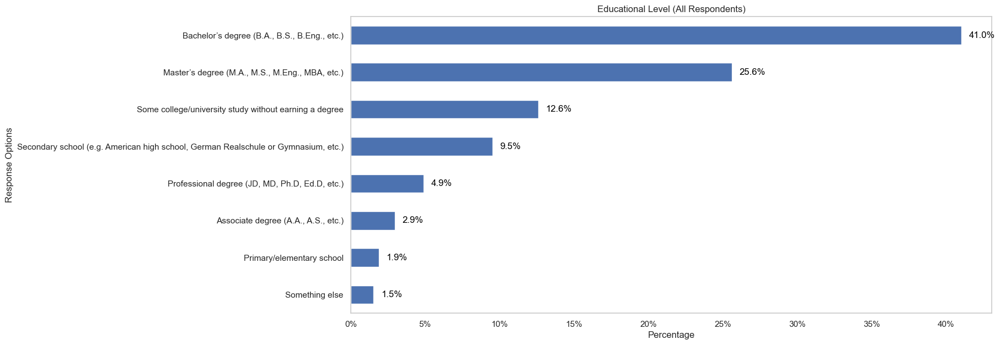

In [31]:
# Display bar chart showing the Educational level distribution for all respondents
# Create the plot
ax = (df['EdLevel'].value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='Educational Level (All Respondents)', 
    figsize=(15,7)
)

# Set the x and y axis label
ax.set_xlabel('Percentage')
plt.ylabel('Response Options')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

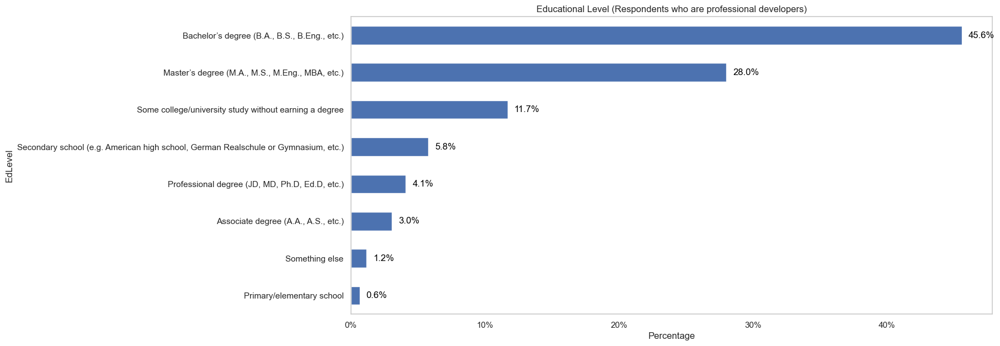

In [33]:
# Display bar chart showing the Educational level distribution for respondents who are professional developers
# Apply the filter
pd_df = df[df['MainBranch'] == 'I am a developer by profession']

# Create the plot
ax = (pd_df['EdLevel'].value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='Educational Level (Respondents who are professional developers)',
    figsize=(15,7)
)

# Set the x and y axis label
ax.set_xlabel('Percentage')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

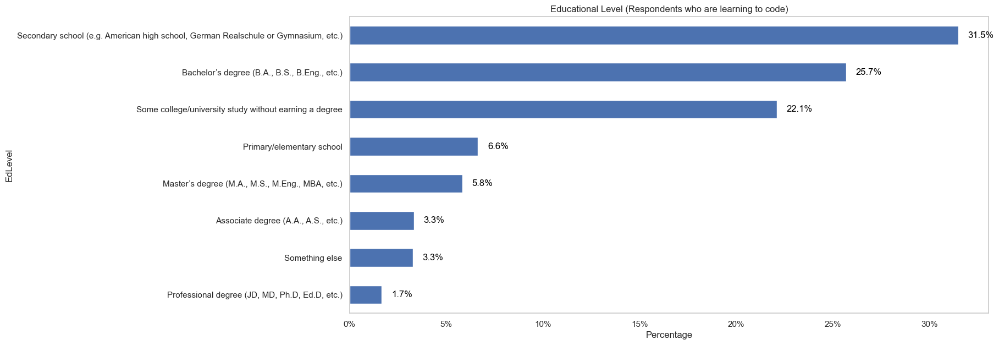

In [35]:
# Display bar chart showing the Educational level distribution for respondents who are learning to code
# Apply the filter
lc_df = df[df['MainBranch'] == 'I am learning to code']

# Create the plot
ax = (lc_df['EdLevel'].value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='Educational Level (Respondents who are learning to code)',
    figsize=(15,7)
)

# Set the x and y axis label
ax.set_xlabel('Percentage')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

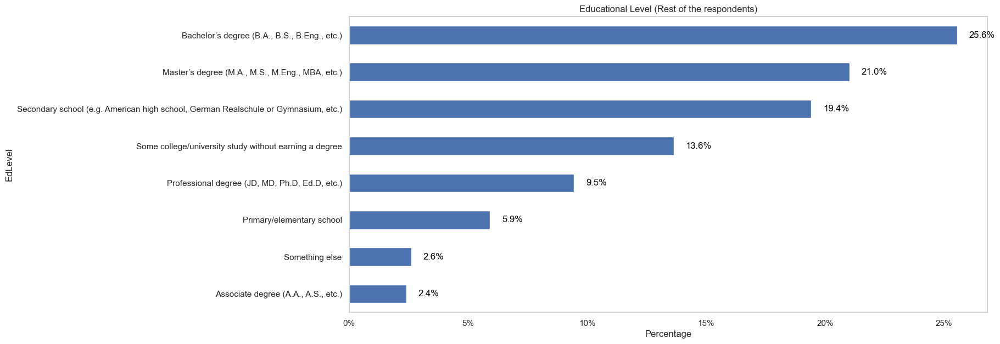

In [37]:
# Display bar chart showing the Educational level distribution for the rest of the respondents
# Apply the filter
rest_df = df[
    (df['MainBranch'].isin([
        'I code primarily as a hobby', 
        'I am not primarily a developer, but I write code sometimes as part of my work/studies', 
        'I used to be a developer by profession, but no longer am'
    ]))
]

# Create the plot
ax = (rest_df['EdLevel'].value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='Educational Level (Rest of the respondents)',
    figsize=(15,7)
)

# Set the x and y axis label
ax.set_xlabel('Percentage')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

In [39]:
# Chapter 1.2: Learning to code

In [41]:
# Split per response option for "Learning to Code" column
learncode = df['LearnCode'].str.split(';', expand=True)

In [43]:
# Display the first 5 rows for the splitted "Learning to Code" column
learncode.head()

,0,1,2,3,4,5,6,7,8
0,Books / Physical media,None,None,None,None,None,None,None,None
1,Books / Physical media,Colleague,On the job training,"Other online resources (e.g., videos, blogs, f...",None,None,None,None,None
2,Books / Physical media,Colleague,On the job training,"Other online resources (e.g., videos, blogs, f...","School (i.e., University, College, etc)",None,None,None,None
3,"Other online resources (e.g., videos, blogs, f...","School (i.e., University, College, etc)",Online Courses or Certification,None,None,None,None,None,None
4,"Other online resources (e.g., videos, blogs, f...",None,None,None,None,None,None,None,None


In [45]:
# Count the occurrences of each unique value across all rows and columns
learncode.stack().value_counts()

Other online resources (e.g., videos, blogs, forum, online community)    49654
Books / Physical media                                                   30392
Online Courses or Certification                                          30271
School (i.e., University, College, etc)                                  29722
On the job training                                                      27244
Colleague                                                                14258
Coding Bootcamp                                                           6503
Friend or family member                                                   6378
Other (please specify):                                                   3635
Name: count, dtype: int64

In [47]:
# Display survey question for "LearnCode" column
schema['LearnCode']

'How do you learn to code? Select all that apply.'

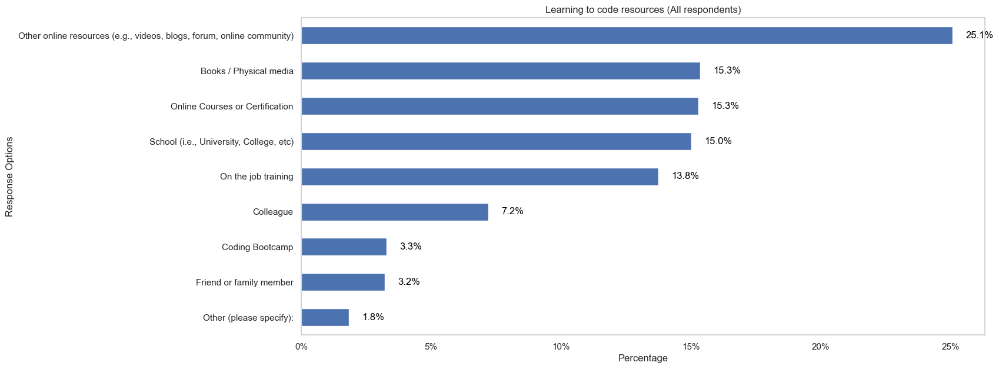

In [49]:
# Display bar chart showing the coding resources used distribution for all respondents
# Create the plot
ax = (learncode.stack().value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='Learning to code resources (All respondents)', 
    figsize=(15,7)
)

# Set the x and y axis label
ax.set_xlabel('Percentage')
plt.ylabel('Response Options')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

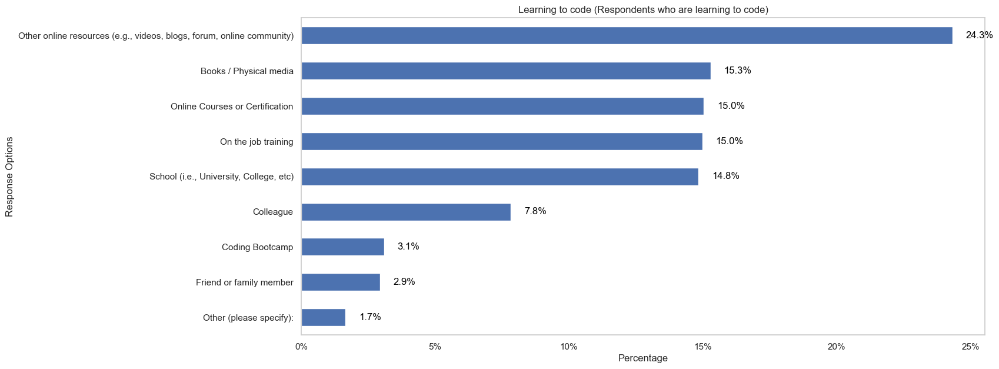

In [51]:
# Display bar chart showing the coding resources used only for respondents who are learning to code
# Apply the filter
learn_code_df = df[df['MainBranch'] == 'I am learning to code']

# Filter the 'learncode' variable based on the filtered DataFrame indices
filtered_learncode = learncode.loc[pd_df.index]

# Create the plot
ax = (filtered_learncode.stack().value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='Learning to code (Respondents who are learning to code)',
    figsize=(15,7)
)

# Set the x and y axis label
ax.set_xlabel('Percentage')
plt.ylabel('Response Options')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

In [53]:
# Split per response option for "Age" column
split_age = df['Age'].str.split(';', expand=True)

In [55]:
# Display the first 5 rows for the splitted "Age" column
split_age.head()

,0
0,Under 18 years old
1,35-44 years old
2,45-54 years old
3,18-24 years old
4,18-24 years old


In [57]:
# Display counts per scale option for "Age" column
split_age.stack().value_counts()

25-34 years old       23911
35-44 years old       14942
18-24 years old       14098
45-54 years old        6249
55-64 years old        2575
Under 18 years old     2568
65 years or older       772
Prefer not to say       322
Name: count, dtype: int64

In [59]:
# Perform the stacking and counting
age_counts = split_age.stack().value_counts()

In [61]:
# Define a new variable for "25-34 years old"
age_25_34 = age_counts.get("25-34 years old", 0)  # Use .get() to avoid KeyError if the key doesn't exist

In [63]:
# Output the value
print("Count of 25-34 years old:", age_25_34)

Count of 25-34 years old: 23911


In [65]:
# Display survey question for "Age" column
schema['Age']

'What is your age?*'

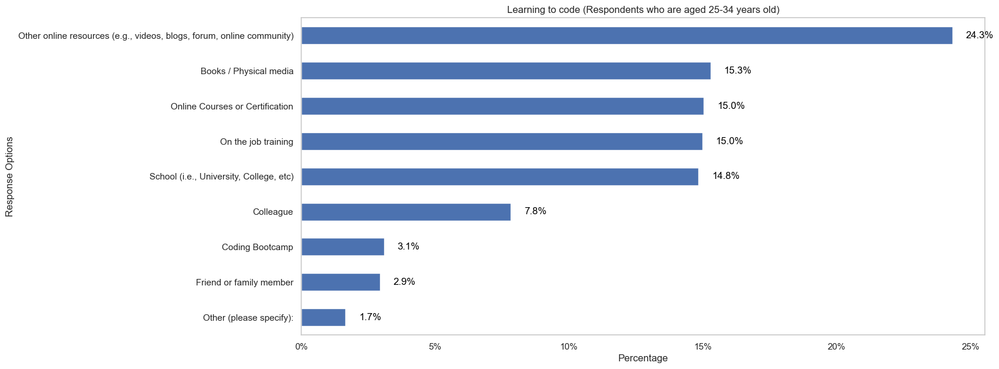

In [67]:
# Display bar chart showing the coding resources used only for respondents who are aged 25-34 years old
# Apply the filter
learn_code__df = df[df['MainBranch'] == 'I am learning to code']

# Filter for respondents aged 25-34 years old
age_25_34 = df[df['Age'] == '25-34 years old']

# Create the plot
ax = (filtered_learncode.stack().value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='Learning to code (Respondents who are aged 25-34 years old)',
    figsize=(15,7)
)

# Set the x and y axis label
ax.set_xlabel('Percentage')
plt.ylabel('Response Options')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

In [69]:
# Chapter 1.3: Years coding

In [71]:
# Display counts per scale option for "Years Coding" column
df['YearsCode'].value_counts()

YearsCode
10                    4561
5                     3723
6                     3496
8                     3449
7                     3333
4                     3290
15                    2813
20                    2636
12                    2559
3                     2518
9                     2251
14                    1822
25                    1671
2                     1642
11                    1636
13                    1477
30                    1461
16                    1401
18                    1228
17                    1038
40                     993
24                     870
22                     842
35                     735
1                      712
23                     634
26                     630
Less than 1 year       569
19                     561
21                     522
28                     512
27                     504
32                     328
34                     293
42                     289
38                     285
29                

In [73]:
# Convert column "Years Coding" to numeric
df['YearsCode'] = pd.to_numeric(df.YearsCode, errors = 'coerce')

In [75]:
# Display survey question for "YearsCode" column
schema['YearsCode']

'Including any education, how many years have you been coding in total?'

<Axes: xlabel='YearsCode', ylabel='Count'>

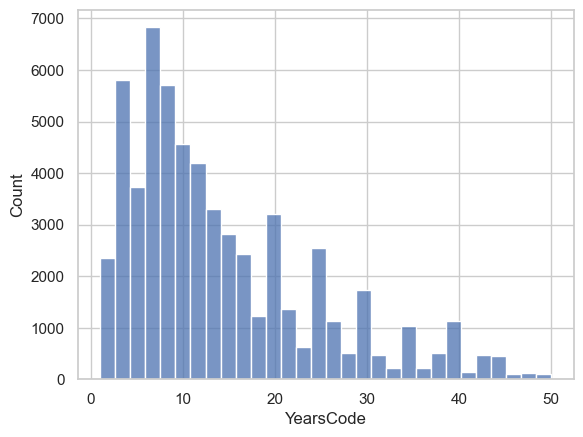

In [77]:
# Create the plot
sns.histplot(df.YearsCode, bins = 30)

In [79]:
# Group years
def map_to_group(year):
    if 1 <= year <= 4:
        return '1 to 4 years'
    elif 5 <= year <= 9:
        return '5 to 9 years'
    elif 10 <= year <= 14:
        return '10 to 14 years'
    elif 15 <= year <= 19:
        return '15 to 19 years'
    elif 20 <= year <= 24:
        return '20 to 24 years'
    elif 25 <= year <= 29:
        return '25 to 29 years'
    elif 30 <= year <= 34:
        return '30 to 34 years'
    elif 35 <= year <= 39:
        return '35 to 39 years'
    elif 40 <= year <= 44:
        return '40 to 44 years'
    elif 45 <= year <= 49:
        return '45 to 49 years'
    elif 'Less than 1 year':
        return 'Less than 1 year'
    elif 'More than 50 years':
        return 'More than 50 years'
    else:
        return 'Not responded'

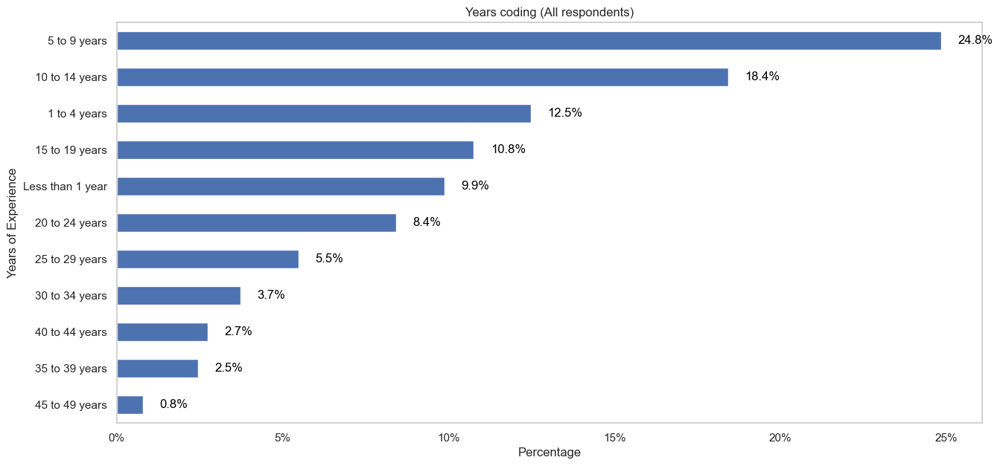

In [81]:
# Apply the mapping function to group the "YearsCode" column
df['Year_Group'] = df['YearsCode'].apply(map_to_group)

# Create the plot
ax = (df['Year_Group'].value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='Years coding (All respondents)',
    figsize=(15, 7)
)

# Set the x and y axis labels
ax.set_xlabel('Percentage')
ax.set_ylabel('Years of Experience')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

In [83]:
# Display counts per scale option for "Years Coding Professionally" column
df['YearsCodePro'].value_counts()

YearsCodePro
2                     4168
3                     4093
5                     3526
10                    3251
4                     3215
Less than 1 year      2856
6                     2843
1                     2639
8                     2549
7                     2517
12                    1777
15                    1635
20                    1549
9                     1493
11                    1312
13                    1127
14                    1082
25                     998
16                     946
18                     867
17                     814
30                     689
24                     632
19                     516
22                     492
23                     448
26                     426
21                     380
27                     380
28                     342
35                     285
29                     196
40                     194
32                     194
34                     169
38                     134
33             

In [85]:
# Convert column "Years Coding Professionally" to numeric
df['YearsCodePro'] = pd.to_numeric(df.YearsCodePro, errors = 'coerce')

In [87]:
# Display survey question for "YearsCodePro" column
schema['YearsCodePro']

'NOT including education, how many years have you coded professionally (as a part of your work)?'

<Axes: xlabel='YearsCodePro', ylabel='Count'>

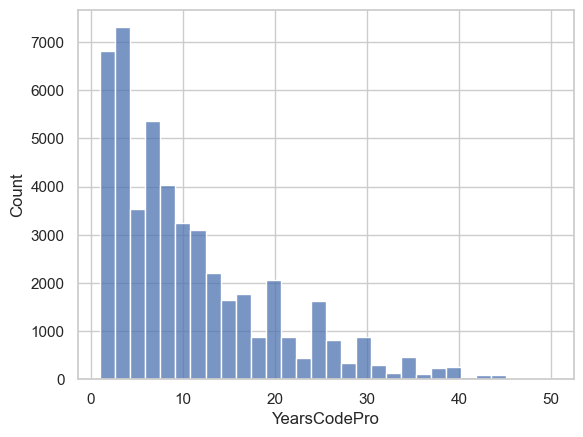

In [89]:
# Create the plot
sns.histplot(df.YearsCodePro, bins = 30)

In [91]:
# Group years
def map_to_group(year):
    if 1 <= year <= 4:
        return '1 to 4 years'
    elif 5 <= year <= 9:
        return '5 to 9 years'
    elif 10 <= year <= 14:
        return '10 to 14 years'
    elif 15 <= year <= 19:
        return '15 to 19 years'
    elif 20 <= year <= 24:
        return '20 to 24 years'
    elif 25 <= year <= 29:
        return '25 to 29 years'
    elif 30 <= year <= 34:
        return '30 to 34 years'
    elif 35 <= year <= 39:
        return '35 to 39 years'
    elif 40 <= year <= 44:
        return '40 to 44 years'
    elif 45 <= year <= 49:
        return '45 to 49 years'
    elif 'Less than 1 year':
        return 'Less than 1 year'
    elif 'More than 50 years':
        return 'More than 50 years'
    else:
        return 'Not responded'

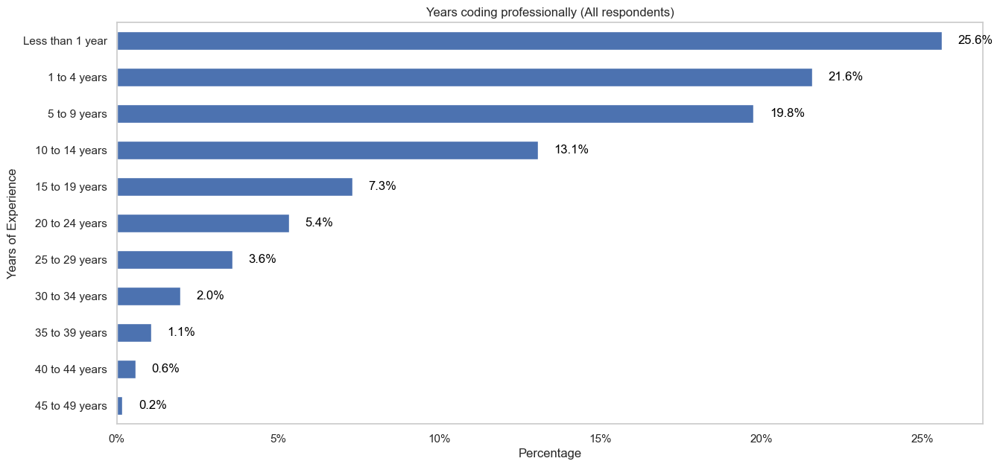

In [93]:
# Apply the mapping function to group the "YearsCodePro" column
df['Year_Group_Pro'] = df['YearsCodePro'].apply(map_to_group)

# Create the plot
ax = (df['Year_Group_Pro'].value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='Years coding professionally (All respondents)',
    figsize=(15, 7)
)

# Set the x and y axis labels
ax.set_xlabel('Percentage')
ax.set_ylabel('Years of Experience')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

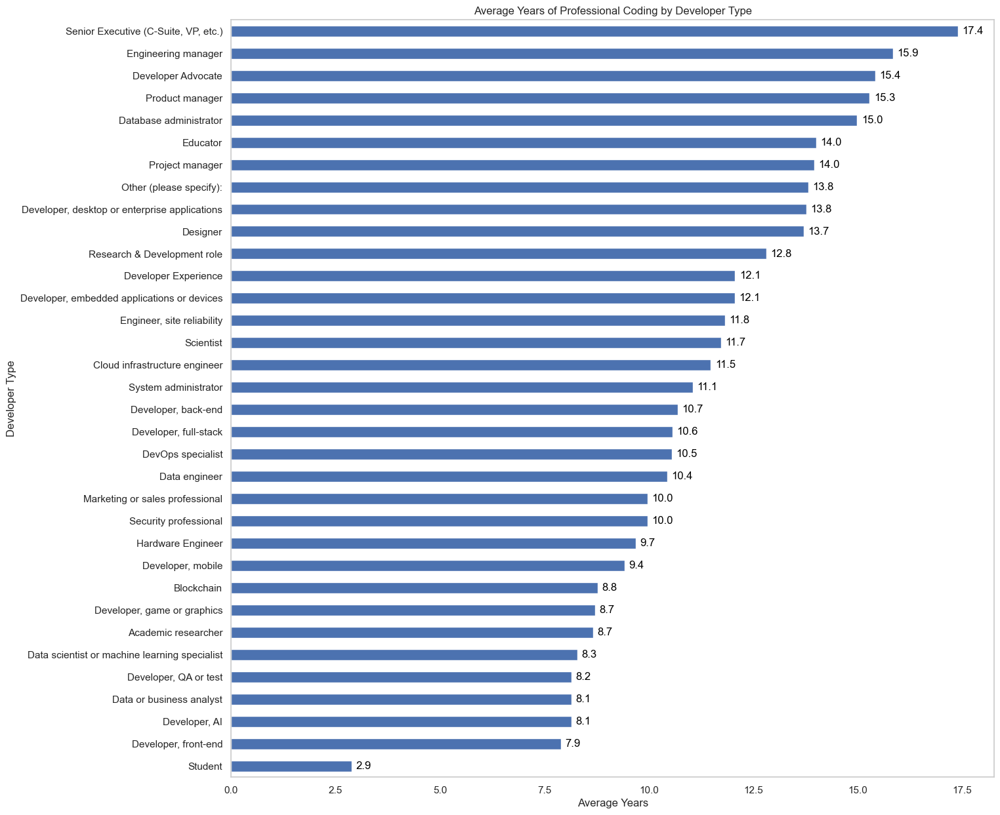

In [99]:
# Compute the average YearsCodePro for each DevType
average_years_by_devtype = df.groupby('DevType')['YearsCodePro'].mean().sort_values(ascending=True)

# Create the plot
ax = average_years_by_devtype.plot(
    kind='barh', 
    title='Average Years of Professional Coding by Developer Type',
    figsize=(15, 15)
)

# Set the x and y axis labels
ax.set_xlabel('Average Years')
ax.set_ylabel('Developer Type')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.1,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}',  # Display the average with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

In [101]:
# Chapter 1.4: Developer roles

In [103]:
# Display counts per scale option for "Developer type" column
df['DevType'].value_counts()

DevType
Developer, full-stack                            18260
Developer, back-end                               9928
Student                                           5102
Developer, front-end                              3349
Developer, desktop or enterprise applications     2493
Other (please specify):                           2458
Developer, mobile                                 2021
Developer, embedded applications or devices       1623
Engineering manager                               1275
Academic researcher                               1238
Data engineer                                     1118
Data scientist or machine learning specialist     1024
DevOps specialist                                 1019
Research & Development role                        943
Senior Executive (C-Suite, VP, etc.)               837
Developer, game or graphics                        706
Cloud infrastructure engineer                      634
System administrator                               552
De

In [105]:
# Display percentage per scale option for "Developer type" column
(df['DevType'].value_counts(normalize=True) * 100)

DevType
Developer, full-stack                            30.717470
Developer, back-end                              16.701152
Student                                           8.582724
Developer, front-end                              5.633779
Developer, desktop or enterprise applications     4.193793
Other (please specify):                           4.134915
Developer, mobile                                 3.399781
Developer, embedded applications or devices       2.730255
Engineering manager                               2.144840
Academic researcher                               2.082597
Data engineer                                     1.880730
Data scientist or machine learning specialist     1.722601
DevOps specialist                                 1.714190
Research & Development role                       1.586340
Senior Executive (C-Suite, VP, etc.)              1.408024
Developer, game or graphics                       1.187652
Cloud infrastructure engineer                   

In [107]:
# Display survey question for "Developer Type" column
schema['DevType']

'Which of the following describes your current job, the one you do most of the time? Please select only one.'

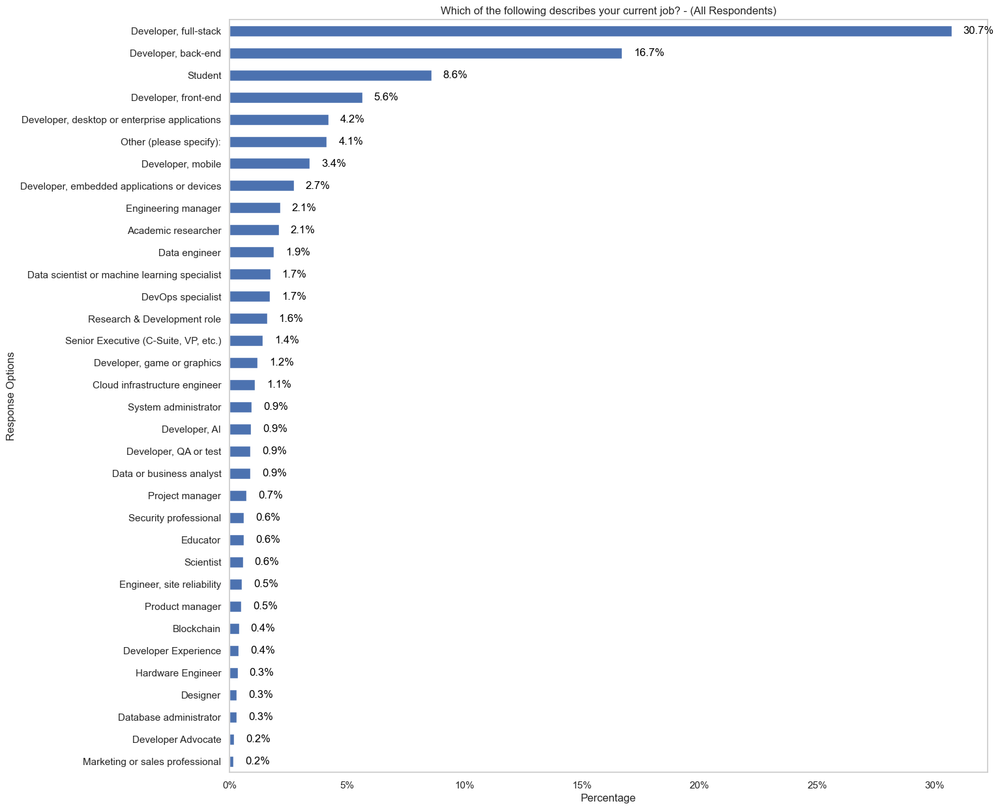

In [109]:
# Create the plot
ax = (df['DevType'].value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='Which of the following describes your current job? - (All Respondents)', 
    figsize=(15,15)
)

# Set the x-axis label
ax.set_xlabel('Percentage')
plt.ylabel('Response Options')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

In [111]:
# Chapter 1.5: Key Territories

In [113]:
# Display counts per scale option for "Country" column
df['Country'].value_counts()

Country
United States of America                                11095
Germany                                                  4947
India                                                    4231
United Kingdom of Great Britain and Northern Ireland     3224
Ukraine                                                  2672
France                                                   2110
Canada                                                   2104
Poland                                                   1534
Netherlands                                              1449
Brazil                                                   1375
Italy                                                    1341
Australia                                                1260
Spain                                                    1123
Sweden                                                   1016
Russian Federation                                        925
Switzerland                                               876


In [115]:
# Display counts per scale option for "Country" column
(df['Country'].value_counts(normalize=True) * 100)

Country
United States of America                                18.827422
Germany                                                  8.394706
India                                                    7.179705
United Kingdom of Great Britain and Northern Ireland     5.470898
Ukraine                                                  4.534193
France                                                   3.580519
Canada                                                   3.570338
Poland                                                   2.603088
Netherlands                                              2.458849
Brazil                                                   2.333277
Italy                                                    2.275581
Australia                                                2.138130
Spain                                                    1.905651
Sweden                                                   1.724079
Russian Federation                                       1.569659
Sw

In [117]:
# Display survey question for "Country" column
schema['Country']

'Where do you live? <span style="font-weight: bolder;">*</span>'

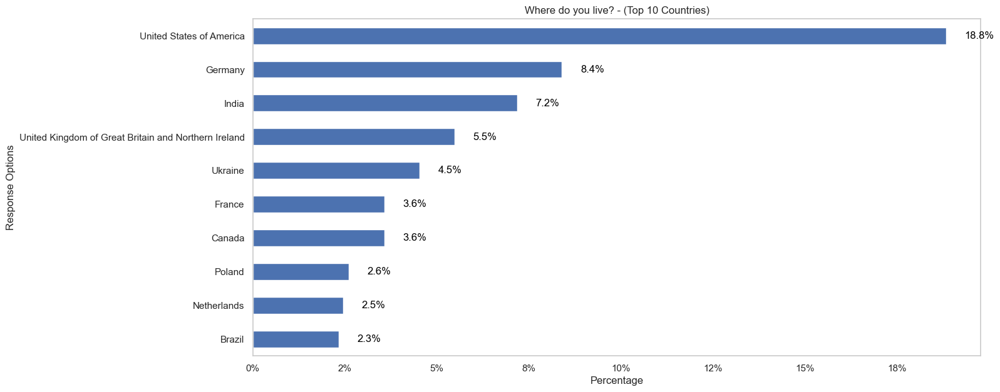

In [119]:
# Display the top 10 countries and normalize to percentage
top_10_countries = (df['Country'].value_counts(normalize=True) * 100).nlargest(10).sort_values(ascending=True)

# Create the plot
ax = top_10_countries.plot(
    kind='barh', 
    title='Where do you live? - (Top 10 Countries)', 
    figsize=(15, 7)
)

# Set the x-axis label
ax.set_xlabel('Percentage')
plt.ylabel('Response Options')

# Add bar labels at the end of the bars
for p in ax.patches:
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label
        va='center',  # Vertically center the label
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

In [121]:
# Calculate the number of responses and percentage for each country
country_counts = df['Country'].value_counts()
country_percentages = (country_counts / country_counts.sum()) * 100

# Combine into a DataFrame
country_table = pd.DataFrame({
    'Country': country_counts.index,
    'Percentage': country_percentages.values,
    'Number of Responses': country_counts.values
})

# Sort by Percentage in descending order
country_table = country_table.sort_values(by='Percentage', ascending=False).reset_index(drop=True)

# Set pandas display option to show all rows
pd.set_option('display.max_rows', None)

# Display the table
country_table

,Country,Percentage,Number of Responses
0,United States of America,18.827422,11095
1,Germany,8.394706,4947
2,India,7.179705,4231
3,United Kingdom of Great Britain and Northern I...,5.470898,3224
4,Ukraine,4.534193,2672
5,France,3.580519,2110
6,Canada,3.570338,2104
7,Poland,2.603088,1534
8,Netherlands,2.458849,1449
9,Brazil,2.333277,1375


In [123]:
# Chapter 1.6: Demographics

In [125]:
# Display counts per scale option for "Age" column
df['Age'].value_counts()

Age
25-34 years old       23911
35-44 years old       14942
18-24 years old       14098
45-54 years old        6249
55-64 years old        2575
Under 18 years old     2568
65 years or older       772
Prefer not to say       322
Name: count, dtype: int64

In [127]:
# Display percentage per scale option for "Age" column
(df['Age'].value_counts(normalize=True) * 100)

Age
25-34 years old       36.540489
35-44 years old       22.834176
18-24 years old       21.544386
45-54 years old        9.549643
55-64 years old        3.935083
Under 18 years old     3.924385
65 years or older      1.179761
Prefer not to say      0.492076
Name: proportion, dtype: float64

In [129]:
# Display survey question for "Age" column
schema['Age']

'What is your age?*'

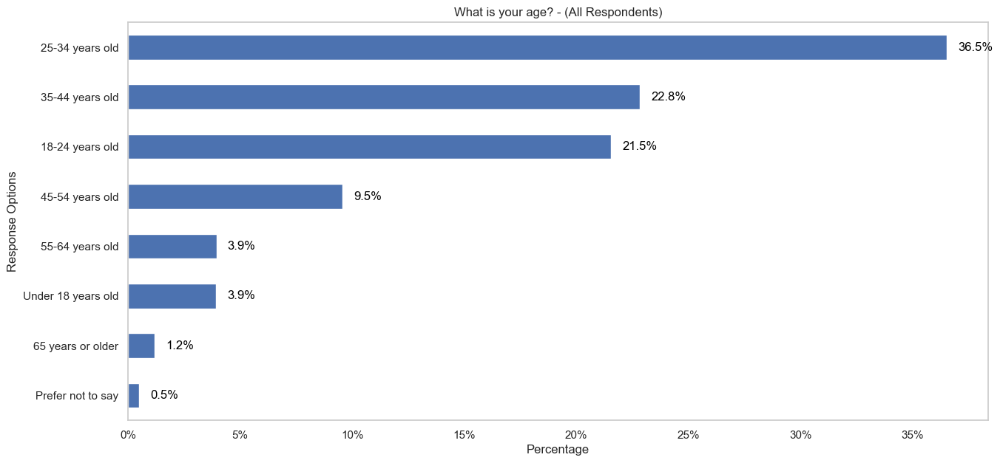

In [131]:
# Create the plot
ax = (df['Age'].value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='What is your age? - (All Respondents)', 
    figsize=(15,7)
)

# Set the x and y axis label
ax.set_xlabel('Percentage')
plt.ylabel('Response Options')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

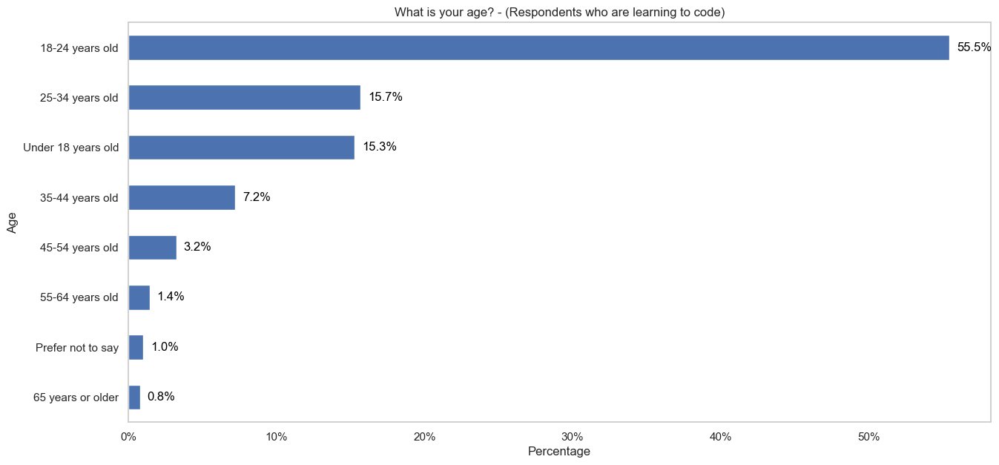

In [133]:
# Apply the filter
pd_df = df[df['MainBranch'] == 'I am learning to code']

# Create the plot
ax = (pd_df['Age'].value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='What is your age? - (Respondents who are learning to code)',
    figsize=(15,7)
)

# Set the x-axis label
ax.set_xlabel('Percentage')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

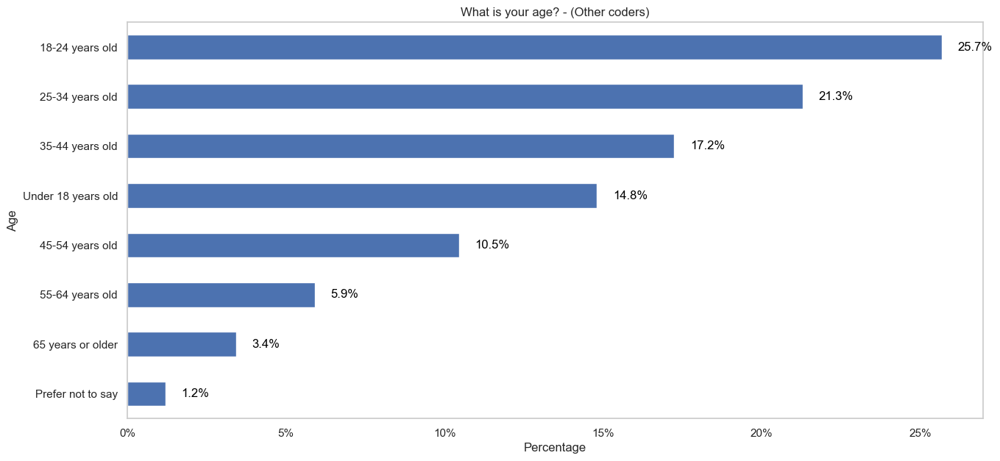

In [135]:
# Apply the filter
pd_df = df[
    (df['MainBranch'].isin([
        'I code primarily as a hobby', 
        'I am not primarily a developer, but I write code sometimes as part of my work/studies', 
        'I used to be a developer by profession, but no longer am'
    ]))
]

# Create the plot
ax = (pd_df['Age'].value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='What is your age? - (Other coders)',
    figsize=(15,7)
)

# Set the x-axis label
ax.set_xlabel('Percentage')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

In [137]:
# Chapter 2 Technology

In [139]:
# Chapter 2.1 Most Popular Technologies

In [141]:
# Display survey question for "LanguageHaveWorkedWith" column
schema['Language']

'Which <b>programming, scripting, and markup languages</b> have you done extensive development work in over the past year, and which do you want to work in over the next year? (If you both worked with the language and want to continue to do so, please check both boxes in that row.)'

In [143]:
# Display counts per scale option for "Language Have Worked With" column
df['LanguageHaveWorkedWith'].value_counts()

LanguageHaveWorkedWith
HTML/CSS;JavaScript;TypeScript                                                                                                                                                                                                                                                                                                                           1002
Python                                                                                                                                                                                                                                                                                                                                                    832
HTML/CSS;JavaScript;PHP;SQL                                                                                                                                                                                                                                                          

In [145]:
# Split per response option for "Language Have Worked With" column
languages = df['LanguageHaveWorkedWith'].str.split(';', expand=True)

In [147]:
# Display the first 5 rows for the splitted "Language Have Worked With" column
languages.head()

,0,1,2,3,4,5,6,7,8,9,...,39,40,41,42,43,44,45,46,47,48
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Bash/Shell (all shells),Go,HTML/CSS,Java,JavaScript,Python,TypeScript,None,None,None,...,None,None,None,None,None,None,None,None,None,None
2,C#,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
3,C,C++,HTML/CSS,Java,JavaScript,PHP,PowerShell,Python,SQL,TypeScript,...,None,None,None,None,None,None,None,None,None,None
4,C++,HTML/CSS,JavaScript,Lua,Python,Rust,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [149]:
# Display counts of distinct languages
languages.stack().value_counts()

JavaScript                 37492
HTML/CSS                   31816
Python                     30719
SQL                        30682
TypeScript                 23150
Bash/Shell (all shells)    20412
Java                       18239
C#                         16318
C++                        13827
C                          12184
PHP                        10951
PowerShell                  8328
Go                          8103
Rust                        7559
Kotlin                      5665
Lua                         3728
Dart                        3594
Assembly                    3233
Ruby                        3147
Swift                       2829
R                           2595
Visual Basic (.Net)         2499
MATLAB                      2378
VBA                         2248
Groovy                      2004
Scala                       1547
Perl                        1482
GDScript                    1402
Objective-C                 1283
Elixir                      1243
Haskell   

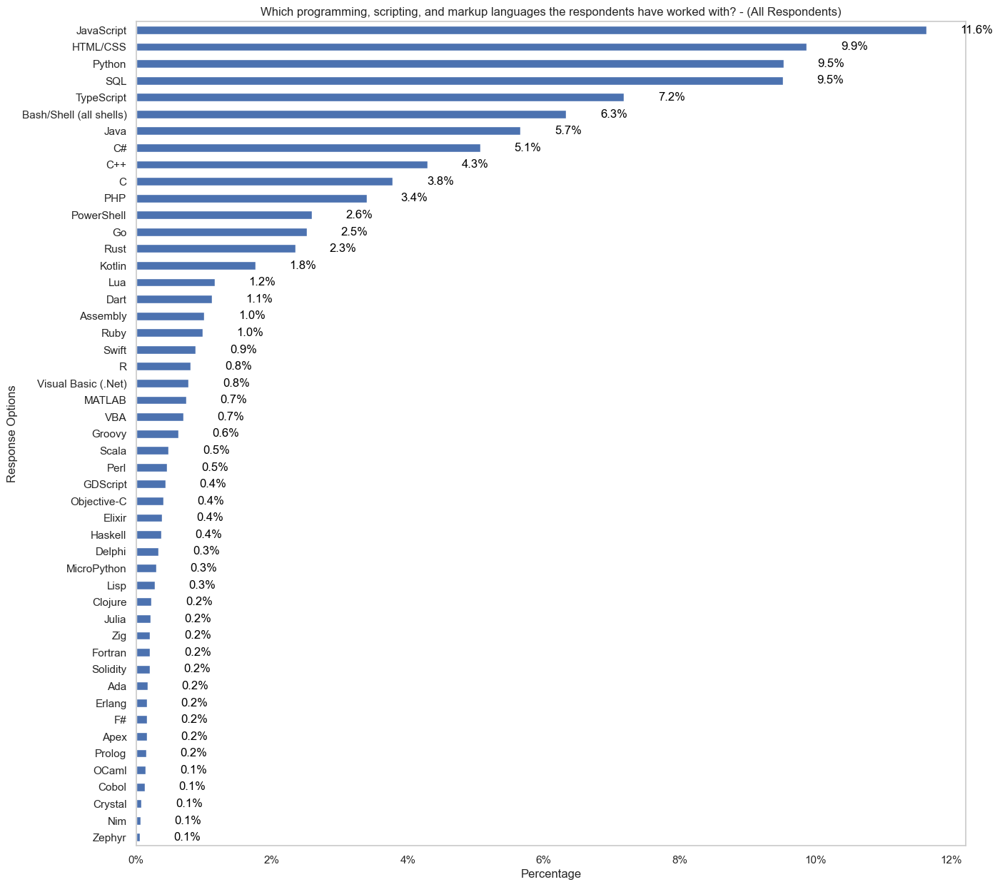

In [151]:
# Create the plot
ax = (languages.stack().value_counts(normalize=True) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='Which programming, scripting, and markup languages the respondents have worked with? - (All Respondents)', 
    figsize=(15,15)
)

# Set the x and y axis label
ax.set_xlabel('Percentage')
plt.ylabel('Response Options')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

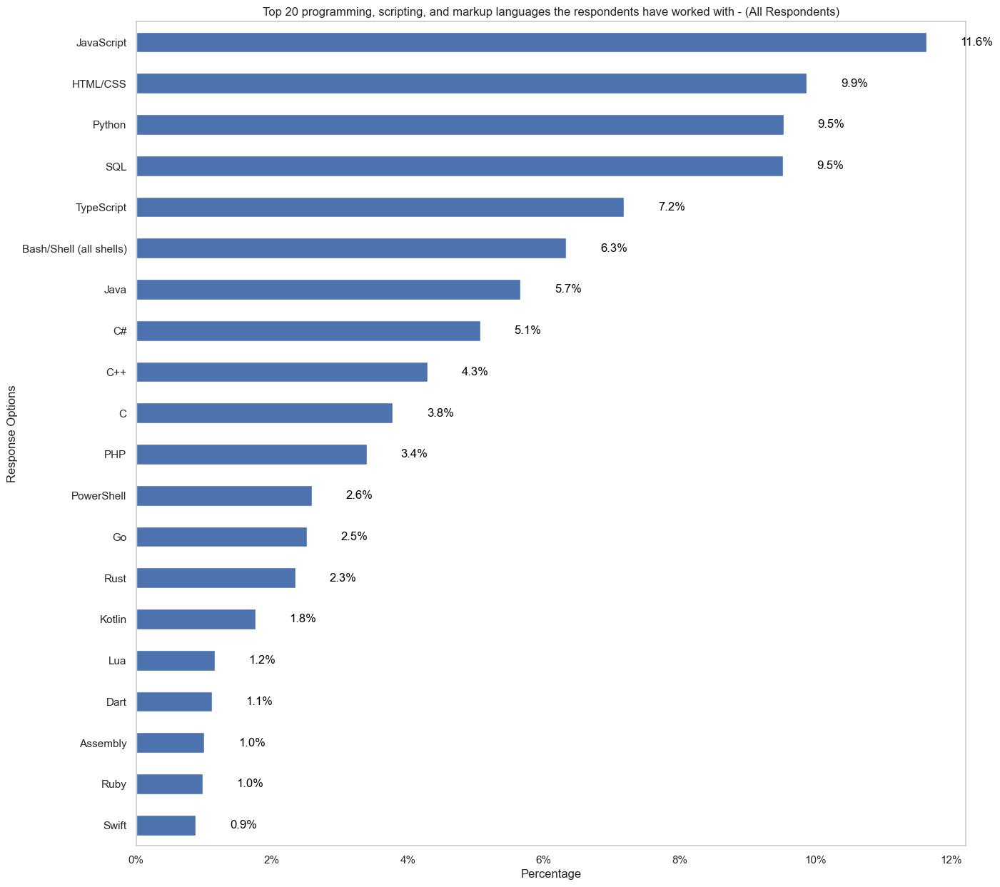

In [153]:
# Create the plot
ax = (languages.stack().value_counts(normalize=True).head(20) * 100).sort_values(ascending=True).plot(
    kind='barh', 
    title='Top 20 programming, scripting, and markup languages the respondents have worked with - (All Respondents)', 
    figsize=(15,15)
)

# Set the x and y axis label
ax.set_xlabel('Percentage')
plt.ylabel('Response Options')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

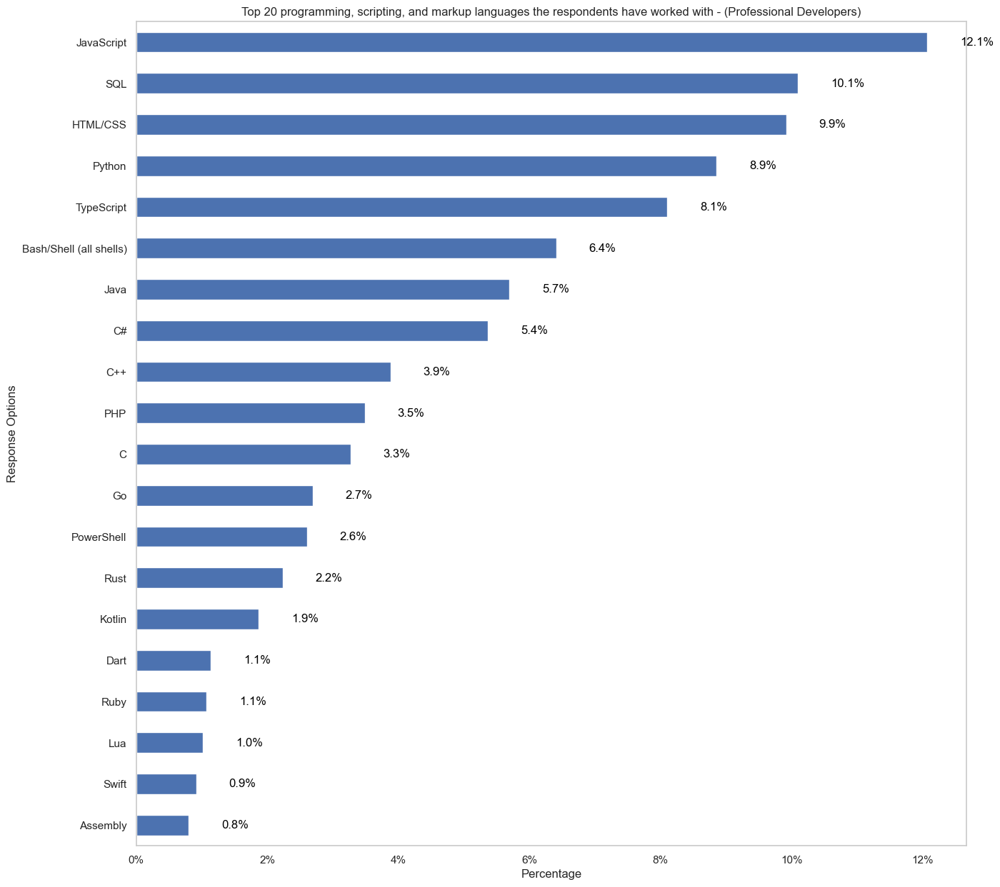

In [155]:
# Filter the DataFrame for professional developers
filtered_df = df[df['MainBranch'] == 'I am a developer by profession']

# Split per response option for "Language Have Worked With" column
languages = filtered_df['LanguageHaveWorkedWith'].str.split(';', expand=True)

# Display counts of distinct languages
language_counts = languages.stack().value_counts(normalize=True)

# Create the plot
ax = (language_counts.head(20) * 100).sort_values(ascending=True).plot(
    kind='barh',
    title='Top 20 programming, scripting, and markup languages the respondents have worked with - (Professional Developers)',
    figsize=(15, 15)
)

# Set the x and y axis label
ax.set_xlabel('Percentage')
plt.ylabel('Response Options')

# Add bar labels at the end of the bars
for p in ax.patches:
    # Position the label at the end of each bar
    ax.text(
        p.get_width() + 0.5,  # Position the label just outside the bar at the end (add padding)
        p.get_y() + p.get_height() / 2,  # Vertically center the label within the bar
        f'{p.get_width():.1f}%',  # Display the percentage with one decimal place
        ha='left',  # Horizontally align the text to the left of the label, so it sits outside the bar
        va='center',  # Vertically center the label inside the bar
        fontsize=12,  # Font size of the label
        color='black'  # Color of the label text
    )

# Format x-axis ticks as percentages
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{x:.0f}%'))

# Remove gridlines
ax.grid(False)

# Show the plot
plt.show()

In [157]:
# Split the multi-value column into individual entries and count occurrences
a = (
    df['LanguageHaveWorkedWith']
    .str.split(';')  # Split each string on the delimiter
    .explode()       # Flatten the lists into individual rows
    .value_counts()  # Count the occurrences of each language
    .sort_values(ascending=False)  # Sort in descending order
)

print(a)

LanguageHaveWorkedWith
JavaScript                 37492
HTML/CSS                   31816
Python                     30719
SQL                        30682
TypeScript                 23150
Bash/Shell (all shells)    20412
Java                       18239
C#                         16318
C++                        13827
C                          12184
PHP                        10951
PowerShell                  8328
Go                          8103
Rust                        7559
Kotlin                      5665
Lua                         3728
Dart                        3594
Assembly                    3233
Ruby                        3147
Swift                       2829
R                           2595
Visual Basic (.Net)         2499
MATLAB                      2378
VBA                         2248
Groovy                      2004
Scala                       1547
Perl                        1482
GDScript                    1402
Objective-C                 1283
Elixir              

In [159]:
# Split the multi-value column into individual entries and count occurrences
b = (
    df['LanguageWantToWorkWith']
    .str.split(';')  # Split each string on the delimiter
    .explode()       # Flatten the lists into individual rows
    .value_counts()  # Count the occurrences of each language
    .sort_values(ascending=False)  # Sort in descending order
)

print(b)

LanguageWantToWorkWith
Python                     25047
JavaScript                 23774
SQL                        22400
HTML/CSS                   20721
TypeScript                 20239
Rust                       17232
Go                         13837
Bash/Shell (all shells)    13744
C#                         12921
C++                        10873
Java                       10668
C                           8275
Kotlin                      7379
PHP                         5745
PowerShell                  4287
Swift                       3877
Dart                        3709
Zig                         3688
Lua                         3322
Assembly                    3007
Elixir                      2895
Ruby                        2774
Haskell                     2221
R                           2177
Scala                       1790
GDScript                    1667
Clojure                     1331
F#                          1272
Julia                       1263
Lisp                

In [161]:
combined_df = pd.concat([a, b], axis=1)
combined_df.columns = ['Language Have Worked With', 'Language Want To Work With']

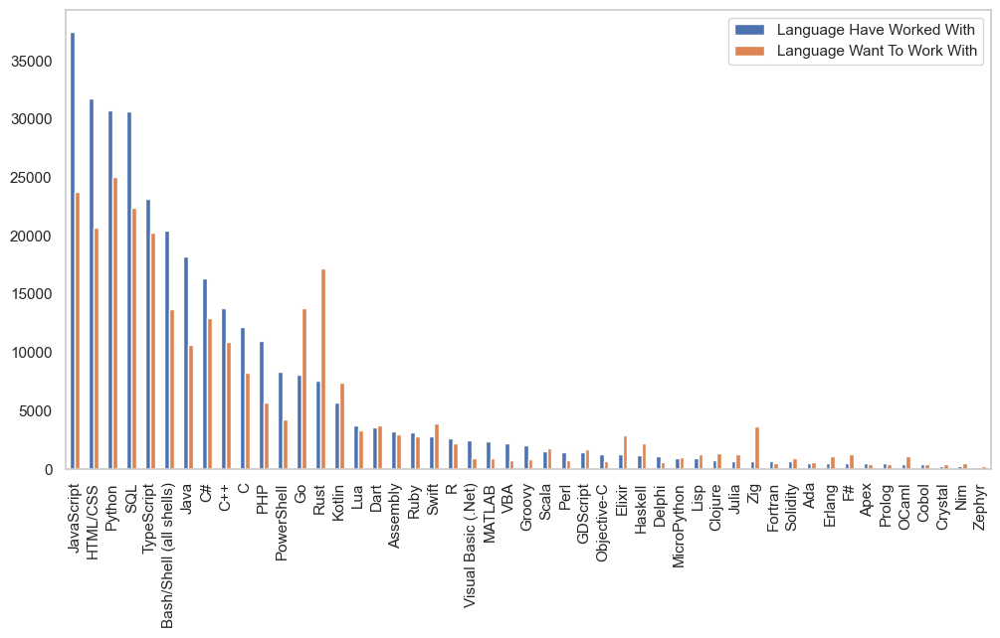

In [163]:
# Plot the combined DataFrame
ax = combined_df.plot(kind='bar', figsize=(12, 6))

# Remove gridlines
ax.grid(False)